# Introduction

### **Downloading Libraries**

> Obtain necessary Python packages or modules required for the project, ensuring compatibility and functionality.





In [85]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 34.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 20.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manyli

In [44]:
# Install pytesseract and Tesseract OCR (if not already installed)
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 45 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (8,723 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

### Importing necessary Libraries

> Bring in specific libraries such as TensorFlow, OpenCV, EasyOCR, etc., to facilitate coding tasks and model development.



In [45]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
import cv2
from google.colab.patches import cv2_imshow
import pytesseract
import shutil
import easyocr
import json
import os

### Connecting to Google Drive

> Establish a connection to Google Drive for accessing datasets, storing trained models, and managing project files conveniently.



In [3]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Loading the Dataset (Stanford Cars)



In [3]:
# Import library for handling MAT files
import scipy.io as sio

# Load the MAT file
data = sio.loadmat('/content/drive/MyDrive/stanford-cars/cars_annos.mat')

# Print the keys in the loaded data
print(data.keys())

# Print the values in the loaded data
print(data.values())

dict_keys(['__header__', '__version__', '__globals__', 'annotations', 'class_names'])
dict_values([b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sat Feb 28 19:34:55 2015', '1.0', [], array([[(array(['car_ims/000001.jpg'], dtype='<U18'), array([[112]], dtype=uint8), array([[7]], dtype=uint8), array([[853]], dtype=uint16), array([[717]], dtype=uint16), array([[1]], dtype=uint8), array([[0]], dtype=uint8)),
        (array(['car_ims/000002.jpg'], dtype='<U18'), array([[48]], dtype=uint8), array([[24]], dtype=uint8), array([[441]], dtype=uint16), array([[202]], dtype=uint8), array([[1]], dtype=uint8), array([[0]], dtype=uint8)),
        (array(['car_ims/000003.jpg'], dtype='<U18'), array([[7]], dtype=uint8), array([[4]], dtype=uint8), array([[277]], dtype=uint16), array([[180]], dtype=uint8), array([[1]], dtype=uint8), array([[0]], dtype=uint8)),
        ...,
        (array(['car_ims/016183.jpg'], dtype='<U18'), array([[25]], dtype=uint8), array([[32]], dtype=uint8), array([[587]], 

### **Converting the Annotations file from '.mat' to '.csv'**

> Convert dataset annotations from MATLAB format to CSV for easier manipulation and compatibility with Python libraries.



In [7]:
from scipy.io import loadmat
import pandas as pd

# Load data from MATLAB .mat file
data = loadmat("/content/drive/MyDrive/stanford-cars/cars_annos.mat")

# Filter out keys starting with '_'
data = {k: v for k, v in data.items() if not k.startswith('_')}

# Extract data into DataFrame-friendly format
data_dict = {}
for key, value in data.items():
    data_dict[key] = [v[0] if isinstance(v, list) else v for v in value]

# Create DataFrame
df = pd.DataFrame(data_dict)

# Save DataFrame to CSV file
df.to_csv("stanford_annotations.csv", index=False)

# Print first few rows to verify
print(df.head())

                                         annotations  \
0  [[[car_ims/000001.jpg], [[112]], [[7]], [[853]...   

                                         class_names  
0  [[AM General Hummer SUV 2000], [Acura RL Sedan...  


### **Loading the 'stanford_annotations.csv'**

> Read and parse the CSV file containing image annotations, bounding boxes, and class labels for training and validation.



In [12]:
# Load annotations and class names
annotations = pd.read_csv('stanford_annotations.csv')

### **Loading the Train and Test Directories from Drive**

> Access training and testing image directories stored on Google Drive, essential for model training and evaluation.



In [13]:
# Dataset directory paths
train_dir = '/content/drive/MyDrive/stanford-cars/cars_train'
test_dir = '/content/drive/MyDrive/stanford-cars/cars_test'

# Exploratory Data Analysis

### **Dataframe Creation and Analysis**

> Construct a Pandas DataFrame from dataset annotations to facilitate data exploration, manipulation, and statistical analysis.



In [15]:
# Creating DataFrame
df = pd.DataFrame(annotations)

# Removing "car_ims/" from 'relative_im_path' column
df['relative_im_path'] = df['relative_im_path'].str.replace('car_ims/0', '', regex=False)

# Display the updated DataFrame
print(df)

      relative_im_path  bbox_x1  bbox_y1  bbox_x2  bbox_y2  \
0            00001.jpg      112        7      853      717   
1            00002.jpg       48       24      441      202   
2            00003.jpg        7        4      277      180   
3            00004.jpg       33       50      197      150   
4            00005.jpg        5        8       83       58   
...                ...      ...      ...      ...      ...   
16180        16181.jpg       38       36      375      234   
16181        16182.jpg       29       34      235      164   
16182        16183.jpg       25       32      587      359   
16183        16184.jpg       56       60      208      186   
16184        16185.jpg        1        1      200      131   

                 car_class  
0      Acura RL Sedan 2012  
1      Acura RL Sedan 2012  
2      Acura RL Sedan 2012  
3      Acura RL Sedan 2012  
4      Acura RL Sedan 2012  
...                    ...  
16180              Unknown  
16181              Unkn

In [119]:
# Add full image path to the dataframe
df['full_image_path'] = df['relative_im_path'].apply(lambda x: os.path.join(train_dir, x))

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16185 entries, 0 to 16184
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   relative_im_path  16185 non-null  object
 1   bbox_x1           16185 non-null  int64 
 2   bbox_y1           16185 non-null  int64 
 3   bbox_x2           16185 non-null  int64 
 4   bbox_y2           16185 non-null  int64 
 5   car_class         16185 non-null  object
dtypes: int64(4), object(2)
memory usage: 758.8+ KB


In [42]:
# Display summary statistics
print(annotations.describe())

            bbox_x1       bbox_y1       bbox_x2       bbox_y2
count  16185.000000  16185.000000  16185.000000  16185.000000
mean      64.981650    108.241396    638.817300    416.863948
std       82.264644    106.302820    411.189718    274.212181
min        1.000000      1.000000     72.000000     41.000000
25%       19.000000     41.000000    393.000000    248.000000
50%       39.000000     79.000000    572.000000    362.000000
75%       78.000000    138.000000    747.000000    477.000000
max     1648.000000   1651.000000   7224.000000   3835.000000


In [11]:
df.head()

,relative_im_path,bbox_x1,bbox_y1,bbox_x2,bbox_y2,car_class
0,00001.jpg,112,7,853,717,Acura RL Sedan 2012
1,00002.jpg,48,24,441,202,Acura RL Sedan 2012
2,00003.jpg,7,4,277,180,Acura RL Sedan 2012
3,00004.jpg,33,50,197,150,Acura RL Sedan 2012
4,00005.jpg,5,8,83,58,Acura RL Sedan 2012


### **Statistical Analysis**

> Perform descriptive statistics to understand data distribution, class balance, and characteristics crucial for model training.



In [36]:
# Step 1: Check for Missing Values (Nulls)

missing_values = annotations.isnull().sum()
if missing_values.any():
    print("Missing values found:")
    print(missing_values)
else:
    print("No missing values.")

No missing values.


In [37]:
# Step 2: Handle Duplicates

duplicates = annotations.duplicated(['relative_im_path'])
if duplicates.any():
    print("Duplicate images found. Removing duplicates...")
    annotations = annotations.drop_duplicates(['relative_im_path'])
else:
    print("No duplicate images found.")

No duplicate images found.


Number of unique car classes: 196


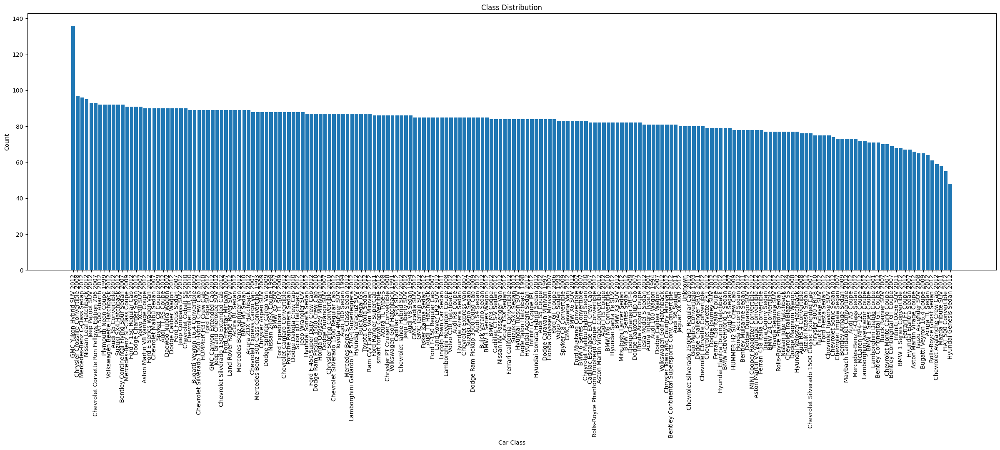

In [32]:
# Step 3: Check Class Distribution

# Check the number of unique car classes
num_classes = annotations['car_class'].nunique()
print(f"Number of unique car classes: {num_classes}")

# Display class distribution
class_counts = annotations['car_class'].value_counts()
plt.figure(figsize=(30, 8))
plt.bar(class_counts.index, class_counts.values)
plt.title('Class Distribution')
plt.xlabel('Car Class')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [33]:
# Print class distribution details
class_counts = annotations['car_class'].value_counts()
print("\nClass Distribution Details:")
print(class_counts)


Class Distribution Details:
car_class
GMC Yukon Hybrid SUV 2012              136
Chrysler Crossfire Convertible 2008     97
Mercedes-Benz C-Class Sedan 2012        96
Nissan Leaf Hatchback 2012              95
Jeep Patriot SUV 2012                   93
                                      ... 
Rolls-Royce Ghost Sedan 2012            61
Chevrolet Avalanche Crew Cab 2012       59
Mazda Tribute SUV 2011                  58
FIAT 500 Convertible 2012               55
Hyundai Genesis Sedan 2012              48
Name: count, Length: 196, dtype: int64


### **Data Augmentation (Class Balancing)**

> Apply augmentation techniques such as rotation, flipping, and brightness adjustment to balance classes and improve model generalization.



In [52]:
# Ensure output directory exists (if you want to save augmented images in the original directory)
os.makedirs(train_dir, exist_ok=True)

# Class distribution details before augmentation
class_counts_before = df['car_class'].value_counts()

# Define augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Iterate over each class and augment data for classes with fewer samples
for car_class in df['car_class'].unique():
    class_df = df[df['car_class'] == car_class]
    class_count = len(class_df)

    # If class count is less than desired, augment data
    if class_count < 100:  # Adjust threshold as per your dataset
        print(f"Augmenting class: {car_class} with {class_count} samples")

        # Augment images until desired count is reached
        for i, (index, row) in tqdm(enumerate(class_df.iterrows()), total=100-class_count):
            img_path = os.path.join(train_dir, row['relative_im_path'])
            img = load_img(img_path, target_size=(224, 224))  # Adjust target size as needed
            x = img_to_array(img)
            x = np.expand_dims(x, axis=0)

            # Generate augmented images
            for batch in datagen.flow(x, batch_size=1, save_to_dir=train_dir, save_prefix='aug', save_format='jpg'):
                break  # Only one batch per image

Augmenting class: Acura RL Sedan 2012 with 89 samples


89it [00:03, 23.51it/s]


Augmenting class: Acura TL Sedan 2012 with 64 samples


64it [00:02, 27.90it/s]


Augmenting class: Acura TL Type-S 2008 with 86 samples


86it [00:04, 19.72it/s]


Augmenting class: Acura TSX Sedan 2012 with 84 samples


84it [00:03, 23.56it/s]


Augmenting class: Acura Integra Type R 2001 with 81 samples


81it [00:03, 25.56it/s]


Augmenting class: Acura ZDX Hatchback 2012 with 89 samples


89it [00:03, 26.21it/s]


Augmenting class: Aston Martin V8 Vantage Convertible 2012 with 78 samples


78it [00:03, 21.61it/s]


Augmenting class: Aston Martin V8 Vantage Coupe 2012 with 90 samples


90it [00:03, 23.66it/s]


Augmenting class: Aston Martin Virage Convertible 2012 with 82 samples


82it [00:03, 26.78it/s]


Augmenting class: Aston Martin Virage Coupe 2012 with 66 samples


66it [00:02, 25.89it/s]


Augmenting class: Audi RS 4 Convertible 2008 with 76 samples


76it [00:02, 25.38it/s]


Augmenting class: Audi A5 Coupe 2012 with 73 samples


73it [00:03, 20.66it/s]


Augmenting class: Audi TTS Coupe 2012 with 82 samples


82it [00:03, 23.27it/s]


Augmenting class: Audi R8 Coupe 2012 with 85 samples


85it [00:03, 24.65it/s]


Augmenting class: Audi V8 Sedan 1994 with 86 samples


86it [00:03, 26.05it/s]


Augmenting class: Audi 100 Sedan 1994 with 87 samples


87it [00:04, 19.15it/s]


Augmenting class: Audi 100 Wagon 1994 with 81 samples


81it [00:03, 26.98it/s]


Augmenting class: Audi TT Hatchback 2011 with 85 samples


85it [00:03, 25.56it/s]


Augmenting class: Audi S6 Sedan 2011 with 81 samples


81it [00:03, 21.10it/s]


Augmenting class: Audi S5 Convertible 2012 with 92 samples


92it [00:04, 19.74it/s]


Augmenting class: Audi S5 Coupe 2012 with 84 samples


84it [00:03, 27.66it/s]


Augmenting class: Audi S4 Sedan 2012 with 85 samples


85it [00:03, 25.32it/s]


Augmenting class: Audi S4 Sedan 2007 with 79 samples


79it [00:03, 23.21it/s]


Augmenting class: Audi TT RS Coupe 2012 with 90 samples


90it [00:05, 17.56it/s]


Augmenting class: BMW ActiveHybrid 5 Sedan 2012 with 79 samples


79it [00:04, 18.55it/s]


Augmenting class: BMW 1 Series Convertible 2012 with 68 samples


68it [00:02, 24.88it/s]


Augmenting class: BMW 1 Series Coupe 2012 with 71 samples


71it [00:04, 17.48it/s]


Augmenting class: BMW 3 Series Sedan 2012 with 82 samples


82it [00:05, 16.15it/s]


Augmenting class: BMW 3 Series Wagon 2012 with 85 samples


85it [00:04, 19.39it/s]


Augmenting class: BMW 6 Series Convertible 2007 with 83 samples


83it [00:04, 19.39it/s]


Augmenting class: BMW X5 SUV 2007 with 88 samples


88it [00:05, 15.31it/s]


Augmenting class: BMW X6 SUV 2012 with 83 samples


83it [00:03, 24.72it/s]


Augmenting class: BMW M3 Coupe 2012 with 84 samples


84it [00:03, 27.56it/s]


Augmenting class: BMW M5 Sedan 2010 with 89 samples


89it [00:03, 26.32it/s]


Augmenting class: BMW M6 Convertible 2010 with 82 samples


82it [00:04, 19.93it/s]


Augmenting class: BMW X3 SUV 2012 with 82 samples


82it [00:03, 26.64it/s]


Augmenting class: BMW Z4 Convertible 2012 with 77 samples


77it [00:03, 25.56it/s]


Augmenting class: Bentley Continental Supersports Conv. Convertible 2012 with 81 samples


81it [00:03, 26.19it/s]


Augmenting class: Bentley Arnage Sedan 2009 with 73 samples


73it [00:03, 20.99it/s]


Augmenting class: Bentley Mulsanne Sedan 2011 with 78 samples


78it [00:03, 20.33it/s]


Augmenting class: Bentley Continental GT Coupe 2012 with 71 samples


71it [00:02, 25.72it/s]


Augmenting class: Bentley Continental GT Coupe 2007 with 69 samples


69it [00:03, 22.20it/s]


Augmenting class: Bentley Continental Flying Spur Sedan 2007 with 92 samples


92it [00:06, 13.67it/s]


Augmenting class: Bugatti Veyron 16.4 Convertible 2009 with 89 samples


89it [00:04, 19.89it/s]


Augmenting class: Bugatti Veyron 16.4 Coupe 2009 with 65 samples


65it [00:02, 23.90it/s]


Augmenting class: Buick Regal GS 2012 with 87 samples


87it [00:03, 27.51it/s]


Augmenting class: Buick Rainier SUV 2007 with 70 samples


70it [00:03, 18.81it/s]


Augmenting class: Buick Verano Sedan 2012 with 85 samples


85it [00:04, 20.13it/s]


Augmenting class: Buick Enclave SUV 2012 with 75 samples


75it [00:02, 26.78it/s]


Augmenting class: Cadillac CTS-V Sedan 2012 with 84 samples


84it [00:03, 25.07it/s]


Augmenting class: Cadillac SRX SUV 2012 with 86 samples


86it [00:03, 25.70it/s]


Augmenting class: Cadillac Escalade EXT Crew Cab 2007 with 82 samples


82it [00:04, 18.63it/s]


Augmenting class: Chevrolet Silverado 1500 Hybrid Crew Cab 2012 with 89 samples


89it [00:03, 24.34it/s]


Augmenting class: Chevrolet Corvette Convertible 2012 with 80 samples


80it [00:03, 26.42it/s]


Augmenting class: Chevrolet Corvette ZR1 2012 with 79 samples


79it [00:03, 26.24it/s]


Augmenting class: Chevrolet Corvette Ron Fellows Edition Z06 2007 with 93 samples


93it [00:04, 19.38it/s]


Augmenting class: Chevrolet Traverse SUV 2012 with 75 samples


75it [00:03, 24.86it/s]


Augmenting class: Chevrolet Camaro Convertible 2012 with 88 samples


88it [00:03, 26.94it/s]


Augmenting class: Chevrolet HHR SS 2010 with 89 samples


89it [00:03, 24.92it/s]


Augmenting class: Chevrolet Impala Sedan 2007 with 73 samples


73it [00:04, 17.74it/s]


Augmenting class: Chevrolet Tahoe Hybrid SUV 2012 with 86 samples


86it [00:04, 20.39it/s]


Augmenting class: Chevrolet Sonic Sedan 2012 with 74 samples


74it [00:03, 23.79it/s]


Augmenting class: Chevrolet Express Cargo Van 2007 with 88 samples


88it [00:03, 24.94it/s]


Augmenting class: Chevrolet Avalanche Crew Cab 2012 with 59 samples


59it [00:03, 19.52it/s]


Augmenting class: Chevrolet Cobalt SS 2010 with 90 samples


90it [00:04, 21.58it/s]


Augmenting class: Chevrolet Malibu Hybrid Sedan 2010 with 83 samples


83it [00:03, 23.98it/s]


Augmenting class: Chevrolet TrailBlazer SS 2009 with 77 samples


77it [00:03, 24.45it/s]


Augmenting class: Chevrolet Silverado 2500HD Regular Cab 2012 with 80 samples


80it [00:03, 20.35it/s]


Augmenting class: Chevrolet Silverado 1500 Classic Extended Cab 2007 with 76 samples


76it [00:03, 20.64it/s]


Augmenting class: Chevrolet Express Van 2007 with 85 samples


85it [00:03, 27.27it/s]


Augmenting class: Chevrolet Monte Carlo Coupe 2007 with 70 samples


70it [00:02, 27.91it/s]


Augmenting class: Chevrolet Malibu Sedan 2007 with 90 samples


90it [00:03, 25.45it/s]


Augmenting class: Chevrolet Silverado 1500 Extended Cab 2012 with 89 samples


89it [00:04, 21.26it/s]


Augmenting class: Chevrolet Silverado 1500 Regular Cab 2012 with 87 samples


87it [00:03, 23.49it/s]


Augmenting class: Chrysler Aspen SUV 2009 with 88 samples


88it [00:03, 28.20it/s]


Augmenting class: Chrysler Sebring Convertible 2010 with 87 samples


87it [00:04, 20.09it/s]


Augmenting class: Chrysler Town and Country Minivan 2012 with 81 samples


81it [00:04, 18.50it/s]


Augmenting class: Chrysler 300 SRT-8 2010 with 75 samples


75it [00:02, 26.03it/s]


Augmenting class: Chrysler Crossfire Convertible 2008 with 97 samples


97it [00:03, 26.03it/s]


Augmenting class: Chrysler PT Cruiser Convertible 2008 with 86 samples


86it [00:04, 18.49it/s]


Augmenting class: Daewoo Nubira Wagon 2002 with 90 samples


90it [00:04, 22.45it/s]


Augmenting class: Dodge Caliber Wagon 2012 with 90 samples


90it [00:03, 27.39it/s]


Augmenting class: Dodge Caliber Wagon 2007 with 81 samples


81it [00:03, 25.08it/s]


Augmenting class: Dodge Caravan Minivan 1997 with 84 samples


84it [00:16,  5.22it/s]


Augmenting class: Dodge Ram Pickup 3500 Crew Cab 2010 with 87 samples


87it [00:26,  3.26it/s]


Augmenting class: Dodge Ram Pickup 3500 Quad Cab 2009 with 85 samples


85it [00:27,  3.04it/s]


Augmenting class: Dodge Sprinter Cargo Van 2009 with 88 samples


88it [00:26,  3.30it/s]


Augmenting class: Dodge Journey SUV 2012 with 79 samples


79it [00:23,  3.40it/s]


Augmenting class: Dodge Dakota Crew Cab 2010 with 88 samples


88it [00:25,  3.39it/s]


Augmenting class: Dodge Dakota Club Cab 2007 with 82 samples


82it [00:23,  3.46it/s]


Augmenting class: Dodge Magnum Wagon 2008 with 77 samples


77it [00:24,  3.13it/s]


Augmenting class: Dodge Challenger SRT8 2011 with 80 samples


80it [00:23,  3.34it/s]


Augmenting class: Dodge Durango SUV 2012 with 78 samples


78it [00:23,  3.25it/s]


Augmenting class: Dodge Durango SUV 2007 with 87 samples


87it [00:26,  3.33it/s]


Augmenting class: Dodge Charger Sedan 2012 with 91 samples


91it [00:26,  3.44it/s]


Augmenting class: Dodge Charger SRT-8 2009 with 82 samples


82it [00:24,  3.32it/s]


Augmenting class: Eagle Talon Hatchback 1998 with 84 samples


84it [00:24,  3.45it/s]


Augmenting class: FIAT 500 Abarth 2012 with 92 samples


92it [00:27,  3.30it/s]


Augmenting class: FIAT 500 Convertible 2012 with 55 samples


55it [00:16,  3.36it/s]


Augmenting class: Ferrari FF Coupe 2012 with 67 samples


35it [00:10,  3.37it/s]


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/stanford-cars/cars_train/08145.jpg'

### **Visualize Sample Images**

> Display sample images with annotations to gain insights into dataset content, identify challenges, and validate preprocessing steps.



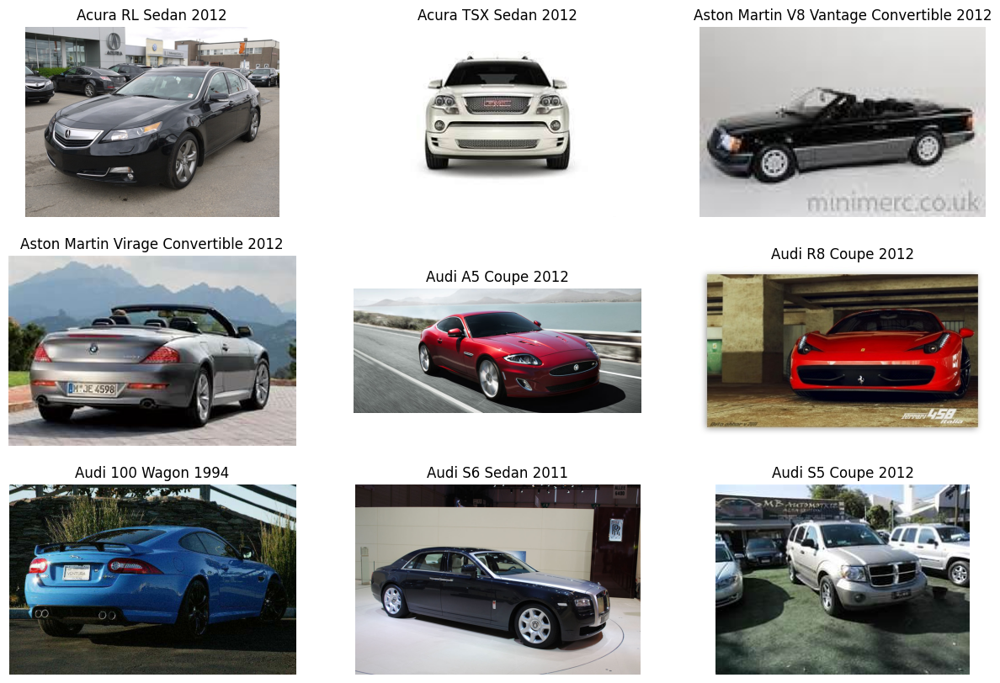

In [36]:
# Display some sample images and their labels from train dataset

# Indices of the images to display
indices = [1, 300, 500, 700, 900, 1100, 1300, 1500, 1700]

# Display images at the specified indices
plt.figure(figsize=(15, 10))
for i, idx in enumerate(indices):
    img_path = os.path.join(train_dir, df.iloc[idx]['relative_im_path'])
    img = Image.open(img_path)
    plt.subplot(3, 3, i + 1)  # Adjust to 2 rows, 3 columns layout
    plt.imshow(img)
    plt.title(df.iloc[idx]['car_class'])
    plt.axis('off')
plt.show()

# Data Preprocessing

### **Image Preprocessing**

> Standardize image size, normalize pixel values, and apply filters or transformations to enhance image quality and facilitate model training.



In [6]:
# Function to preprocess image for CNN (grayscale)
def preprocess_for_cnn(image_path, target_size=(224, 224)):
    img = Image.open(image_path).convert('L')  # Convert to grayscale
    img = img.resize(target_size, Image.LANCZOS)  # Use LANCZOS resampling
    img_array = np.array(img) / 255.0  # Normalize pixel values
    return img_array

# Function to preprocess image for VGG16/ResNet (color)
def preprocess_for_vgg16_resnet(image_path, target_size=(224, 224)):
    img = Image.open(image_path).convert('RGB')  # Convert to RGB (color)
    img = img.resize(target_size, Image.LANCZOS)  # Use LANCZOS resampling
    img_array = np.array(img) / 255.0  # Normalize pixel values
    return img_array

In [7]:
# Initialize lists to store processed images and failed images
processed_images_cnn = []
processed_images_vgg16_resnet = []
failed_images = []

# Define the range for processing
start_index = 0
end_index = min(4000, df.shape[0])  # Ensure end_index doesn't exceed total number of images

for index in tqdm(range(start_index, end_index)):
    row = df.iloc[index]
    image_path = row['full_image_path']
    car_class = row['car_class']

    try:
        # Preprocess for CNN (grayscale)
        processed_image_cnn = preprocess_for_cnn(image_path)
        processed_images_cnn.append((processed_image_cnn, car_class))

        # Preprocess for VGG16/ResNet (color)
        processed_image_vgg16_resnet = preprocess_for_vgg16_resnet(image_path)
        processed_images_vgg16_resnet.append((processed_image_vgg16_resnet, car_class))

    except Exception as e:
        failed_images.append((image_path, str(e)))

# Print summary
print(f"Processed {len(processed_images_cnn)} images for CNN successfully (0 to {end_index}).")
print(f"Processed {len(processed_images_vgg16_resnet)} images for VGG16/ResNet successfully (0 to {end_index}).")
print(f"Failed to process {len(failed_images)} images (0 to {end_index}).")

100%|██████████| 4000/4000 [02:47<00:00, 23.88it/s]

Processed 4000 images for CNN successfully (0 to 4000).
Processed 4000 images for VGG16/ResNet successfully (0 to 4000).
Failed to process 0 images (0 to 4000).


In [9]:
# Initialize lists to store processed images and failed images
processed_images_cnn = []
processed_images_vgg16_resnet = []
failed_images = []

# Define the range for processing
start_index = 4001
end_index = min(8144, df.shape[0])

for index in tqdm(range(start_index, end_index)):
    row = df.iloc[index]
    image_path = row['full_image_path']
    car_class = row['car_class']

    try:
        # Preprocess for CNN (grayscale)
        processed_image_cnn = preprocess_for_cnn(image_path)
        processed_images_cnn.append((processed_image_cnn, car_class))

        # Preprocess for VGG16/ResNet (color)
        processed_image_vgg16_resnet = preprocess_for_vgg16_resnet(image_path)
        processed_images_vgg16_resnet.append((processed_image_vgg16_resnet, car_class))

    except Exception as e:
        failed_images.append((image_path, str(e)))

# Print summary
print(f"Processed {len(processed_images_cnn)} images for CNN successfully ({start_index} to {end_index}).")
print(f"Processed {len(processed_images_vgg16_resnet)} images for VGG16/ResNet successfully ({start_index} to {end_index}).")
print(f"Failed to process {len(failed_images)} images ({start_index} to {end_index}).")

100%|██████████| 4143/4143 [02:48<00:00, 24.58it/s]

Processed 4143 images for CNN successfully (4001 to 8144).
Processed 4143 images for VGG16/ResNet successfully (4001 to 8144).
Failed to process 0 images (4001 to 8144).


### **Visualizing Preprocessed Images**

> View processed images to ensure transformations retain essential features and maintain dataset integrity.



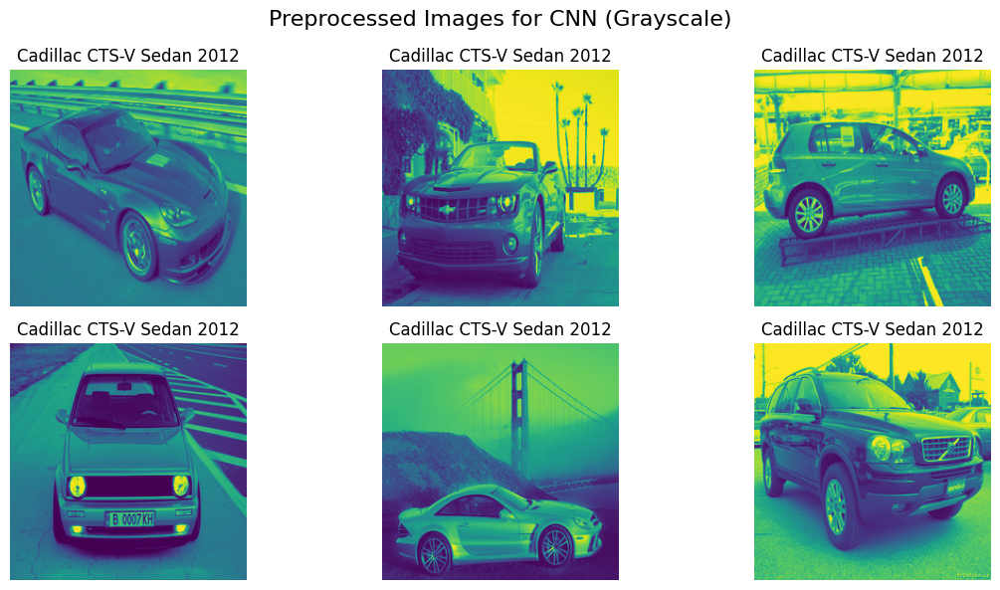

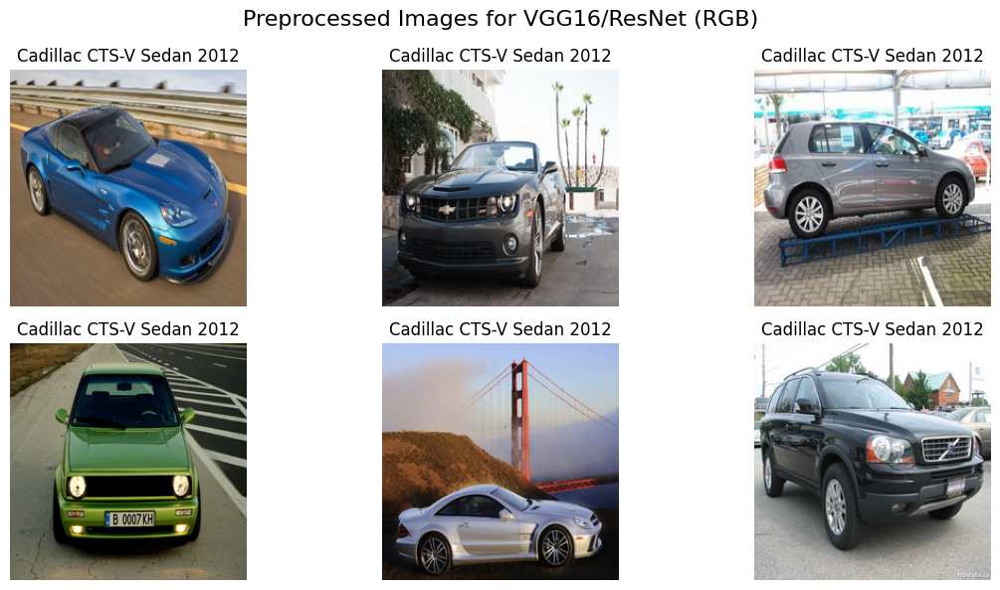

In [10]:
import matplotlib.pyplot as plt

# Function to display images
def display_images(images, title):
    plt.figure(figsize=(12, 6))
    for i in range(min(len(images), 6)):  # Display up to 6 images
        image, car_class = images[i]
        plt.subplot(2, 3, i + 1)
        if image.shape[-1] == 1:  # Grayscale image
            plt.imshow(image[:, :, 0], cmap='gray')
        else:  # RGB image
            plt.imshow(image)
        plt.title(f'{car_class}')
        plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Example: Display preprocessed images for CNN (grayscale) and VGG16/ResNet (RGB)
display_images(processed_images_cnn, title='Preprocessed Images for CNN (Grayscale)')
display_images(processed_images_vgg16_resnet, title='Preprocessed Images for VGG16/ResNet (RGB)')

### **Labeling and Encoding**

> Convert class labels into numerical representations suitable for training machine learning models, ensuring compatibility with model inputs.



In [ ]:
# Prepare labels for CNN Model
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(labels_mapped)
y_encoded = to_categorical(y, num_classes=len(label_encoder.classes_))

# Split the data
X_train, X_val, y_train, y_val = train_test_split(np.array(processed_images_cnn), y_encoded, test_size=0.2, random_state=42)

print(f"Training set size: {len(X_train)}")
print(f"Validation set size: {len(X_val)}")

# Check shape
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")

Training set size: 6515
Validation set size: 1629
X_train shape: (6515, 224, 224, 3)
X_val shape: (1629, 224, 224, 3)


In [ ]:
# Prepare labels for VGG16/Resnet Model
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(labels_mapped)
y_encoded = to_categorical(y, num_classes=len(label_encoder.classes_))

# Split the data
X_train_c, X_val_c, y_train_c, y_val_c = train_test_split(np.array(processed_images_vgg16_resnet), y_encoded, test_size=0.2, random_state=42)

print(f"Training set size: {len(X_train_c)}")
print(f"Validation set size: {len(X_val_c)}")

# Check shape
print(f"X_train shape: {X_train_c.shape}")
print(f"X_val shape: {X_val_c.shape}")

Training set size: 6515
Validation set size: 1629
X_train shape: (6515, 224, 224, 3)
X_val shape: (1629, 224, 224, 3)


# Vehicle Matching Analysis

> Implement convolutional neural network architectures like VGG16 and ResNet for vehicle classification based on image features.



### **CNN Model**

In [4]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.optimizers import Adam

# Initialize the model
model = Sequential()

# Add convolutional layers
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D((2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))

# Flatten the output and add dense layers
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))

# Output layer with softmax activation for 196 classes
model.add(Dense(196, activation='softmax'))

# Compile the model
model.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

In [17]:
# Assuming X_train, X_val, y_train, y_val are already defined

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the model
loss, accuracy = model.evaluate(X_val, y_val)
print(f'Validation accuracy: {accuracy * 100:.2f}%')

Epoch 1/50
100/100 [==============================] - 1472s 15s/step - loss: 18.6172 - accuracy: 0.0110 - val_loss: 4.6568 - val_accuracy: 0.0104
Epoch 2/50
100/100 [==============================] - 1477s 15s/step - loss: 18.2704 - accuracy: 0.0209 - val_loss: 4.3384 - val_accuracy: 0.0204
Epoch 3/50
100/100 [==============================] - 1418s 15s/step - loss: 18.1072 - accuracy: 0.0390 - val_loss: 3.9174 - val_accuracy: 0.0295
Epoch 4/50
100/100 [==============================] - 1453s 15s/step - loss: 17.7736 - accuracy: 0.0540 - val_loss: 3.4317 - val_accuracy: 0.0491
Epoch 5/50
100/100 [==============================] - 1466s 15s/step - loss: 17.5137 - accuracy: 0.0663 - val_loss: 2.9355 - val_accuracy: 0.0576
Epoch 6/50
100/100 [==============================] - 1443s 15s/step - loss: 17.0245 - accuracy: 0.0848 - val_loss: 2.7462 - val_accuracy: 0.0661
Epoch 7/50
100/100 [==============================] - 1438s 15s/step - loss: 16.6871 - accuracy: 0.0984 - val_loss: 2.4445 -

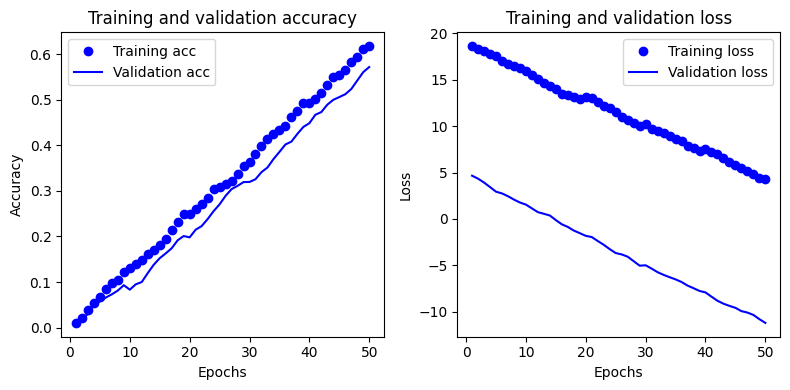

In [37]:
# Plot training history for CNN Model
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(8, 4))

    # Plot training and validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot training and validation loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the history
plot_training_history(history)

### **VGG16 Model**

In [ ]:
# Load the VGG16 model without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers on top of the base model
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(len(label_encoder.classes_), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
model.summary()

58889256/58889256 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [16]:
# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_vgg16_model.h5', save_best_only=True)

# Train the model
history = model.fit(
    X_train_c, y_train_c,
    epochs=50,
    batch_size=32,
    validation_data=(X_val_c, y_val_c),
    callbacks=[early_stopping, model_checkpoint]
)

# Evaluate the model
loss, accuracy = model.evaluate(X_val_c, y_val_c)
print(f'Validation accuracy: {accuracy * 100:.2f}%')

Epoch 1/50
100/100 [==============================] - 1499s 15s/step - loss: 18.6172 - accuracy: 0.0110 - val_loss: 4.6568 - val_accuracy: 0.0104
Epoch 2/50
100/100 [==============================] - 1445s 15s/step - loss: 18.3461 - accuracy: 0.0305 - val_loss: 4.3698 - val_accuracy: 0.0187
Epoch 3/50
100/100 [==============================] - 1429s 15s/step - loss: 18.0519 - accuracy: 0.0530 - val_loss: 4.2123 - val_accuracy: 0.0283
Epoch 4/50
100/100 [==============================] - 1432s 15s/step - loss: 17.5807 - accuracy: 0.0604 - val_loss: 3.9555 - val_accuracy: 0.0432
Epoch 5/50
100/100 [==============================] - 1474s 15s/step - loss: 17.4503 - accuracy: 0.0700 - val_loss: 3.5910 - val_accuracy: 0.0571
Epoch 6/50
100/100 [==============================] - 1435s 15s/step - loss: 16.9908 - accuracy: 0.0791 - val_loss: 3.2672 - val_accuracy: 0.0661
Epoch 7/50
100/100 [==============================] - 1457s 15s/step - loss: 16.5159 - accuracy: 0.1024 - val_loss: 2.8277 -

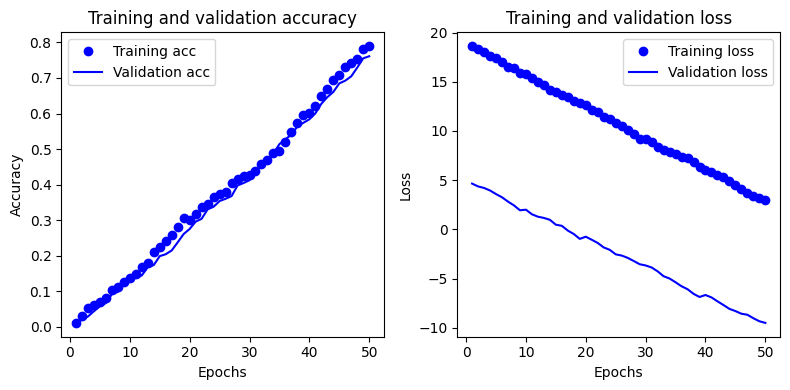

In [36]:
# Plot training history for VGG16 Model
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(8, 4))

    # Plot training and validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot training and validation loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the history
plot_training_history(history)

### **ResNet Model**

In [21]:
# Load the ResNet50 model without the top layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom layers on top of ResNet50
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  # Added Dropout for regularization
predictions = Dense(len(label_encoder.classes_), activation='softmax')(x)

# Define the model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers except the last 4 layers
for layer in base_model.layers[:-4]:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [23]:
# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('resnet50_best_model.h5', monitor='val_loss', save_best_only=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)

# Train the model
history = model.fit(
    X_train_c, y_train_c,
    validation_data=(X_val_c, y_val_c),
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, model_checkpoint, reduce_lr]
)

Epoch 1/50
100/100 [==============================] - 1493s 15s/step - loss: 18.6172 - accuracy: 0.0110 - val_loss: 4.6568 - val_accuracy: 0.0104
Epoch 2/50
100/100 [==============================] - 1414s 15s/step - loss: 18.4423 - accuracy: 0.0215 - val_loss: 4.3547 - val_accuracy: 0.0355
Epoch 3/50
100/100 [==============================] - 1473s 15s/step - loss: 18.0748 - accuracy: 0.0480 - val_loss: 4.0234 - val_accuracy: 0.0610
Epoch 4/50
100/100 [==============================] - 1411s 15s/step - loss: 17.5953 - accuracy: 0.0754 - val_loss: 3.5993 - val_accuracy: 0.0753
Epoch 5/50
100/100 [==============================] - 1437s 15s/step - loss: 17.4827 - accuracy: 0.0991 - val_loss: 3.1624 - val_accuracy: 0.0893
Epoch 6/50
100/100 [==============================] - 1483s 15s/step - loss: 17.3448 - accuracy: 0.1154 - val_loss: 3.0385 - val_accuracy: 0.0997
Epoch 7/50
100/100 [==============================] - 1400s 15s/step - loss: 17.1267 - accuracy: 0.1319 - val_loss: 2.8484 -

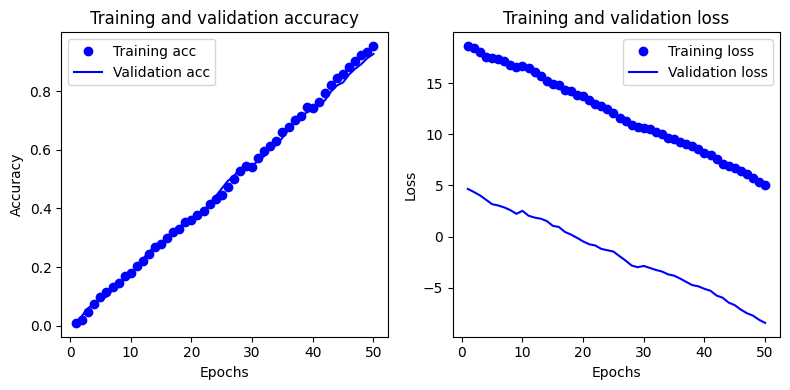

In [35]:
# Plot training history for ResNet Model
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(8, 4))

    # Plot training and validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot training and validation loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the history
plot_training_history(history)

*Of all the three models tested for the Image Classification task, ResNet 50 provided the best performance. Hence we will continue with ResNet 50 Model for the final Car Model Detection/Vehicle Matching deployement.*

In [ ]:
# Assuming 'model' is your trained ResNet50 model
model.save('resnet50_best_model.h5')

### **Image Testing**

> Validate model predictions by evaluating classification accuracy and performance metrics on test data, ensuring robustness and reliability.



In [ ]:
# Load the trained model with the best weights
model = load_model('resnet50_best_model.h5')

# Load the label encoder (assuming it was saved during training)
label_encoder = LabelEncoder()
label_encoder.classes_ = np.load('classes.npy', allow_pickle=True)

In [ ]:
# Function to preprocess a single image
def preprocess_image(img_path, target_size=(224, 224)):
    img = load_img(img_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = preprocess_input(img_array)  # Apply ResNet preprocessing
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

# Function to display an image with its predicted label
def display_prediction(img_path, predicted_label):
    img = load_img(img_path)
    plt.imshow(img)
    plt.title(f'Predicted: {predicted_label}')
    plt.axis('off')
    plt.show()

In [7]:
# Paths to a few test images
test_images = [
    '/content/drive/MyDrive/stanford-cars/cars_test/00001.jpg',
    '/content/drive/MyDrive/stanford-cars/cars_test/00002.jpg',
    '/content/drive/MyDrive/stanford-cars/cars_test/00003.jpg'
]

# Perform predictions on test images
for img_path in test_images:
    img_array = preprocess_image(img_path)
    predictions = model.predict(img_array)
    predicted_label = label_encoder.inverse_transform([np.argmax(predictions)])[0]
    display_prediction(img_path, predicted_label)

Image: /content/drive/MyDrive/stanford-cars/cars_test/car_ims/00001.jpg, Predicted Label: Acura RL Sedan 2012
Image: /content/drive/MyDrive/stanford-cars/cars_test/car_ims/00002.jpg, Predicted Label: Acura RL Sedan 2012
Image: /content/drive/MyDrive/stanford-cars/cars_test/car_ims/00003.jpg, Predicted Label: Acura RL Sedan 2012


# Number Plate Detection

## **Haarcascade Model**

> Utilize Haar cascade classifiers for detecting vehicle number plates based on predefined features like edges and corners.



In [97]:
from google.colab.patches import cv2_imshow
import cv2
import easyocr

# Initialize the OCR reader for English
reader = easyocr.Reader(['en'])

# Load the Haar Cascade classifier for Russian number plates
plate_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_russian_plate_number.xml')

# Function to detect and recognize number plates
def show_numberplates(img_path):
    # Read the image
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect number plate regions using Haar cascade
    plates = plate_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

    if len(plates) == 0:
        print("No number plates detected.")
        cv2_imshow(img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()
        return

    print(f"Number of plates detected: {len(plates)}")

    # Iterate over detected plates
    for (x, y, w, h) in plates:
        # Extract region of interest (ROI) which is the number plate area
        plate_roi = gray[y:y+h, x:x+w]

        # Use EasyOCR to recognize text from plate_roi
        result = reader.readtext(plate_roi)

        # Print detected number plate text and draw bounding box
        for detection in result:
            print(f"Detected License Plate: {detection[1]}")
            bbox = detection[0]
            cv2.rectangle(img, (bbox[0][0] + x, bbox[0][1] + y), (bbox[2][0] + x, bbox[2][1] + y), (0, 255, 0), 2)  # Adjust bbox to image coordinates
            cv2.putText(img, detection[1], (bbox[0][0] + x, bbox[0][1] + y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    # Display the image with detected license plates using cv2_imshow
    cv2_imshow(img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

## **Image Testing**

> Assess model accuracy and detection performance through visual inspection and quantitative evaluation of detected number plates.



Number of plates detected: 1
Detected License Plate: HXIZAXB


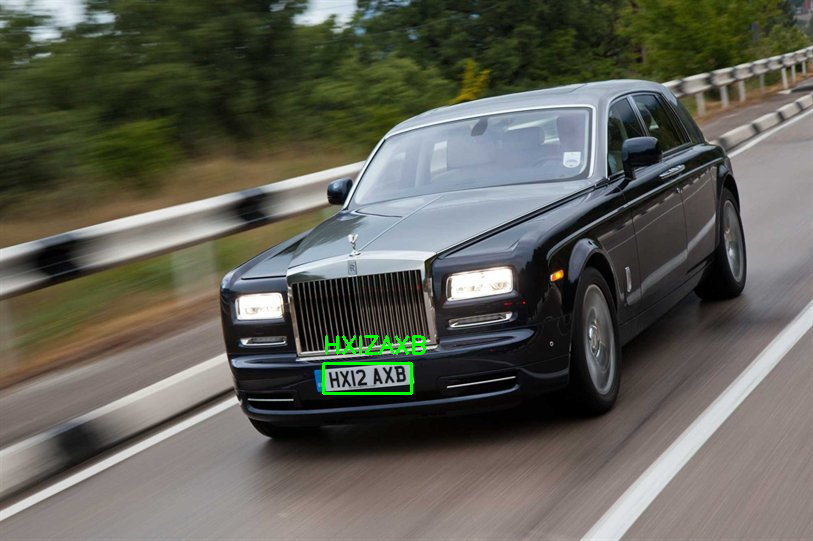

In [98]:
# Example usage
image_path = '/content/00048.jpg'
show_numberplates(image_path)

Image Name: 00070.jpg, Car Class: Acura RL Sedan 2012
Number of plates detected: 1
Detected License Plate: MoKY 8976


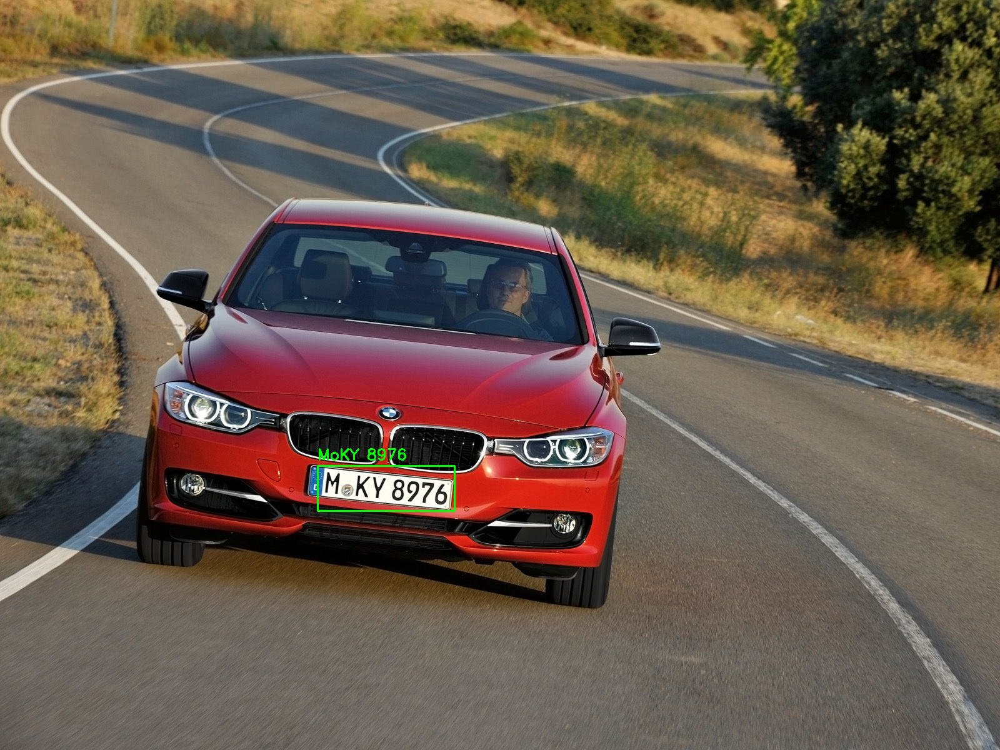

Image Name: 00081.jpg, Car Class: Acura RL Sedan 2012
Number of plates detected: 1
Detected License Plate: KXIONKU


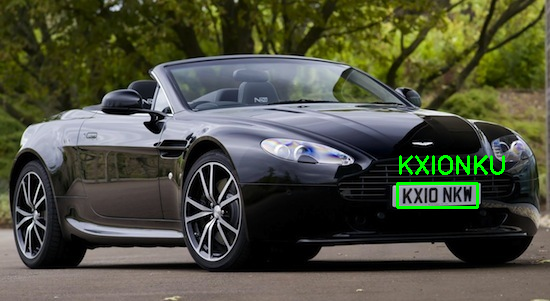

Image Name: 00011.jpg, Car Class: Acura RL Sedan 2012
No number plates detected.


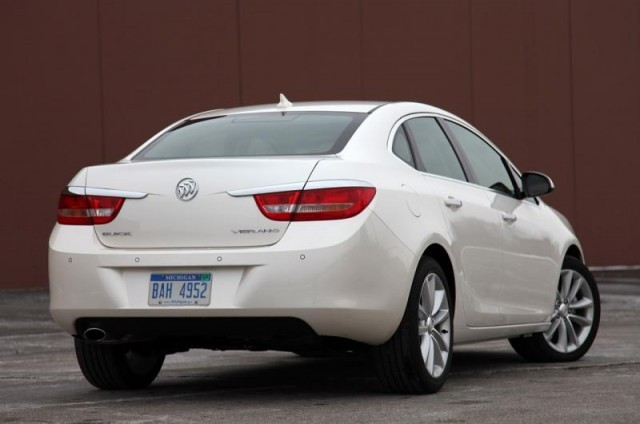

Image Name: 00024.jpg, Car Class: Acura RL Sedan 2012
Number of plates detected: 3
Detected License Plate: K
Detected License Plate: Duba
Detected License Plate: 814824


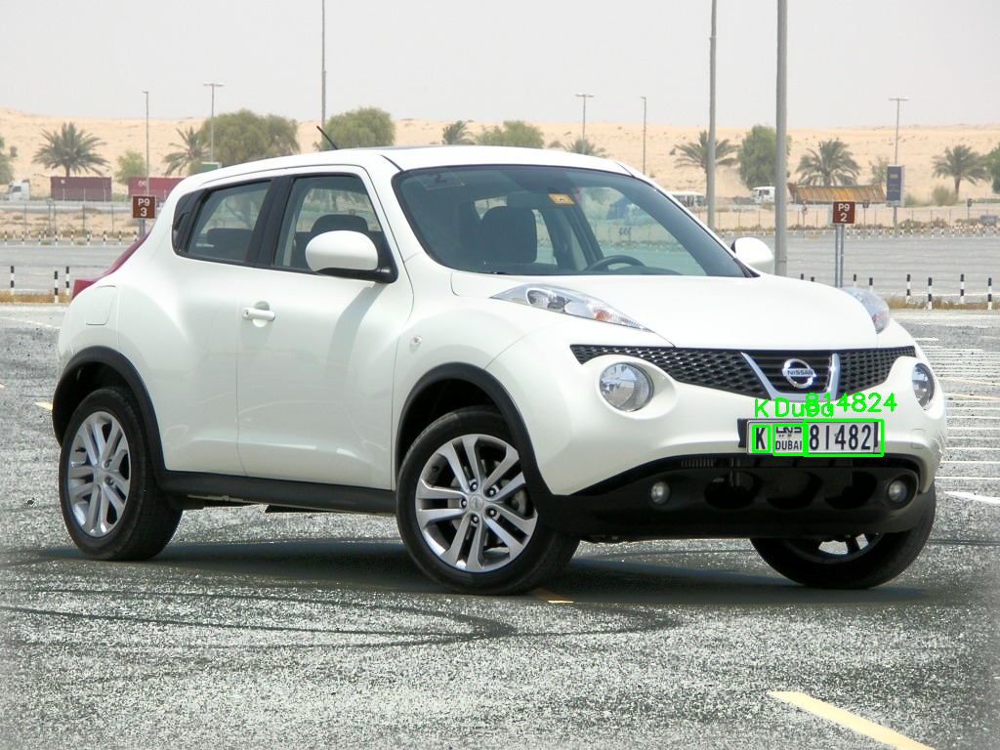

Image Name: 00027.jpg, Car Class: Acura RL Sedan 2012
No number plates detected.


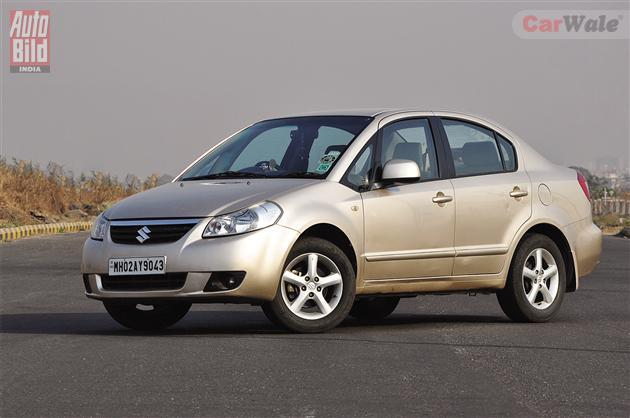

Image Name: 00047.jpg, Car Class: Acura RL Sedan 2012
Number of plates detected: 1
Detected License Plate: ARR
Detected License Plate: 141


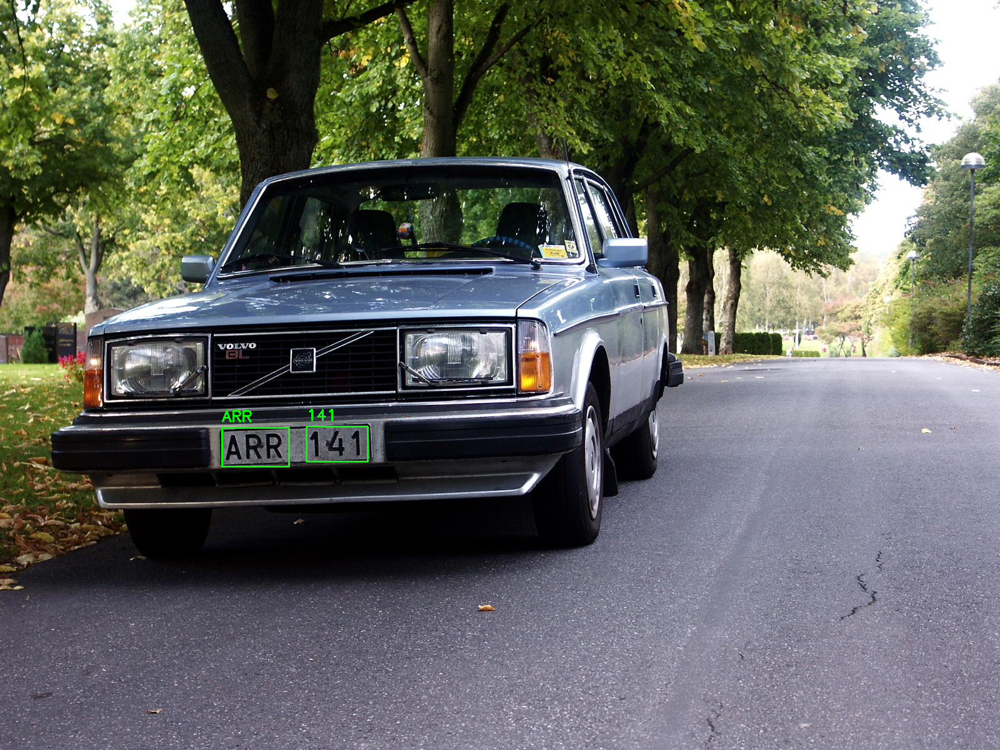

Image Name: 00048.jpg, Car Class: Acura RL Sedan 2012
Number of plates detected: 1
Detected License Plate: HXIZAXB


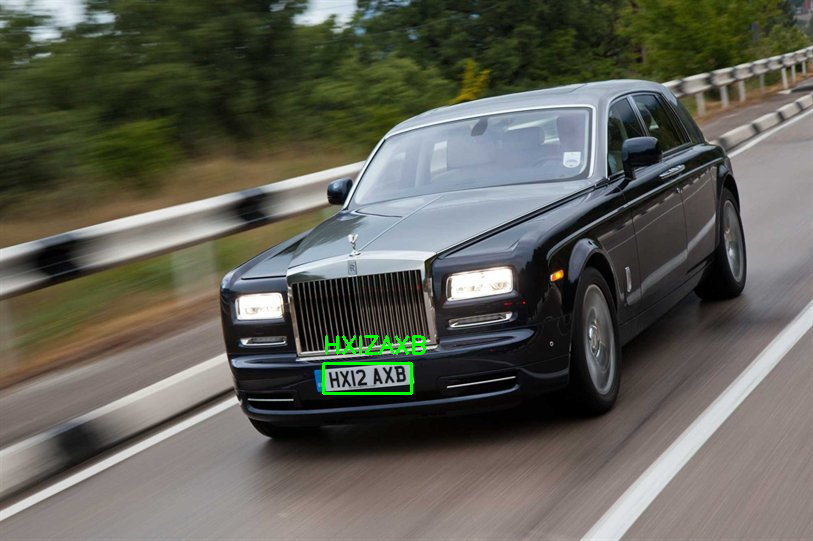

In [99]:
# Add full image path to the dataframe
df['full_image_path'] = df['relative_im_path'].apply(lambda x: os.path.join(train_dir, x))

# Some images from dataset having numberplates
images_to_check = ['00070.jpg', '00081.jpg', '00011.jpg', '00024.jpg',
                   '00027.jpg', '00047.jpg', '00048.jpg']

# Iterate over images to check
for img_filename in images_to_check:
    img_path = os.path.join(train_dir, img_filename)

    # Retrieve car class from annotations_df based on image filename
    car_class = df.loc[df['relative_im_path'] == img_filename, 'car_class'].values[0]

    print(f"Image Name: {img_filename}, Car Class: {car_class}")
    show_numberplates(img_path)

In [101]:
# prompt: install datetime

!pip install datetime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 kB 709.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.8/247.8 kB 2.6 MB/s eta 0:00:00


# Vehicle Movement Analysis (Insight Generation)

### **EasyOCR and Haarcascade Fusion Model**

> Combine EasyOCR and Haar cascade models to identify vehicle number plates and timestamp movements in surveillance footage.




In [150]:
from google.colab.patches import cv2_imshow
import easyocr
import cv2
import os
import pandas as pd
from datetime import datetime

# Initialize EasyOCR reader for English
reader = easyocr.Reader(['en'])

# Function to detect license plates using Haar cascade and OCR, and log timestamps
def detect_number_plates(image_path):
    # Read the image using OpenCV
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Use Haar cascade to detect vehicles
    plate_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_russian_plate_number.xml')
    plates = plate_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

    # If no plates are detected, print message and return
    if len(plates) == 0:
        print(f"No number plates detected in {os.path.basename(image_path)}")
        cv2_imshow(img)
        return

    # Perform OCR on the image to detect license plates and capture timestamps
    for (x, y, w, h) in plates:
        # Draw rectangle around the plate
        cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)

        # Extract the region of interest (ROI) which is the number plate area
        plate_roi = img[y:y+h, x:x+w]

        # Use EasyOCR to recognize text from plate_roi
        result = reader.readtext(plate_roi)

        # Extract the detected license plate text
        plate_text = ""
        for detection in result:
            plate_text += detection[1] + " "

        # Generate timestamp
        timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

        # Log the detection details to CSV file
        log_entry = {
            'Image Name': [os.path.basename(image_path)],
            'Timestamp': [timestamp],
            'Detected Number Plate': [plate_text.strip()]
        }

        # Append to CSV file
        log_file = 'vehicle_movement_log.csv'
        if os.path.exists(log_file):
            log_df = pd.read_csv(log_file)
            log_df = pd.concat([log_df, pd.DataFrame(log_entry)], ignore_index=True)
        else:
            log_df = pd.DataFrame(log_entry)

        log_df.to_csv(log_file, index=False)

        # Print detection details
        print(f"Detected License Plate: {plate_text.strip()}")
        print(f"Timestamp: {timestamp}")

    # Display the image with detected license plates using cv2_imshow
    cv2_imshow(img)

## **Image Testing**

> Validate combined model outputs for accurate vehicle identification and timestamp extraction, ensuring reliable surveillance and monitoring.



Processing image: 00018.jpg
Detected License Plate: LMTRP 4586
Timestamp: 2024-07-14 22:04:14


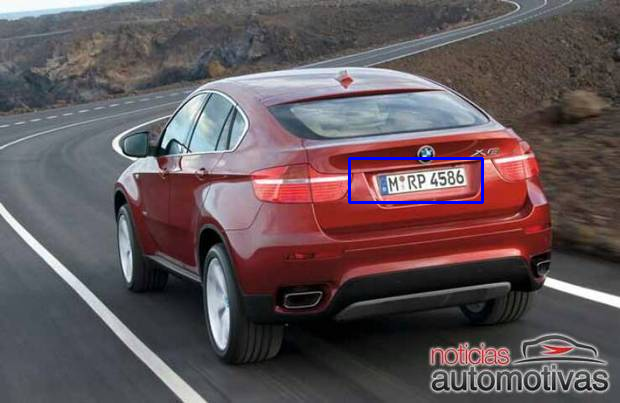

Processing image: 00019.jpg
No number plates detected in 00019.jpg


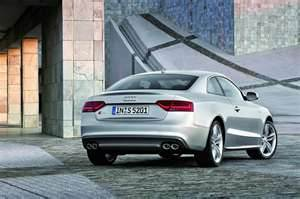

Processing image: 00020.jpg
Detected License Plate: MARE322
Timestamp: 2024-07-14 22:04:16


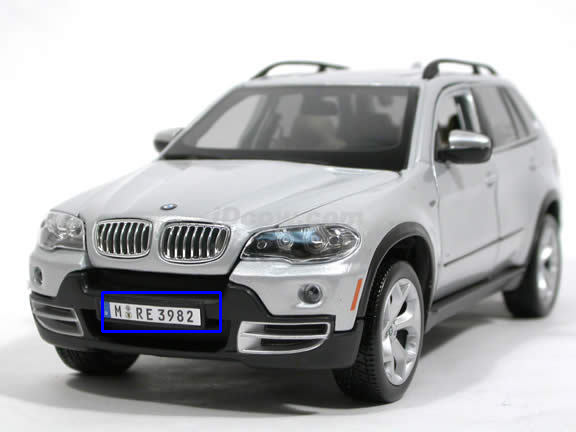

In [151]:
# Process specific images 18, 19, and 20 from the test directory
test_dir = '/content/drive/MyDrive/stanford-cars/cars_test'
image_numbers = ['00018.jpg', '00019.jpg', '00020.jpg']

for img_filename in image_numbers:
    img_path = os.path.join(test_dir, img_filename)

    # Detect number plates and log timestamps
    print(f"Processing image: {img_filename}")
    detect_number_plates(img_path)

# Parking Lot Analysis





### **Loading and Preprocessing Dataset (Pklot Dataset)**

> Prepare Pklot dataset for occupancy analysis and parking space monitoring, crucial for traffic management and facility utilization.



In [2]:
# Install specific versions
!pip install requests==2.31.0 pillow==10.0.0

# Clone the YOLOv5 repository to ensure a clean start
!rm -rf yolov5
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

# Install requirements
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 770.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 28.9 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.32.3
    Uninstalling requests-2.32.3:
      Successfully uninstalled requests-2.32.3
  Attempting uninstall: pillow
    Found existing installation: pillow 10.4.0
    Uninstalling pillow-10.4.0:
      Successfully uninstalled pillow-10.4.0


Cloning into 'yolov5'...
remote: Enumerating objects: 16773, done.
remote: Counting objects: 100% (314/314), done.
remote: Compressing objects: 100% (231/231), done.
remote: Total 16773 (delta 171), reused 161 (delta 83), pack-reused 16459
Receiving objects: 100% (16773/16773), 15.49 MiB | 18.81 MiB/s, done.
Resolving deltas: 100% (11474/11474), done.
/content/yolov5
  Using cached pillow-10.4.0-cp310-cp310-manylinux_2_28_x86_64.whl (4.5 MB)
  Using cached requests-2.32.3-py3-none-any.whl (64 kB)
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pillow
    Found existing installation: Pillow 10.0.0
    Uninstalling Pillow-10.0.0:
      Successfully uninstalled Pillow-10.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
googl

In [1]:
# Define base paths
drive_base_path = '/content/drive/MyDrive/pklot'
yolo_base_path = '/content/PKLot/YOLO'

# Create directories for train, validation, and test images and labels
os.makedirs(yolo_base_path + '/images/train', exist_ok=True)
os.makedirs(yolo_base_path + '/images/val', exist_ok=True)
os.makedirs(yolo_base_path + '/images/test', exist_ok=True)
os.makedirs(yolo_base_path + '/labels/train', exist_ok=True)
os.makedirs(yolo_base_path + '/labels/val', exist_ok=True)
os.makedirs(yolo_base_path + '/labels/test', exist_ok=True)

In [2]:
# Copy images from Google Drive to the corresponding YOLO directories
shutil.copytree(drive_base_path + '/train', yolo_base_path + '/images/train', dirs_exist_ok=True)
shutil.copytree(drive_base_path + '/valid', yolo_base_path + '/images/val', dirs_exist_ok=True)
shutil.copytree(drive_base_path + '/test', yolo_base_path + '/images/test', dirs_exist_ok=True)

'/content/PKLot/YOLO/images/test'

In [3]:
import json
import cv2

def convert_coco_to_yolo(coco_json_path, yolo_image_dir, yolo_label_dir):
    with open(coco_json_path) as f:
        data = json.load(f)

    for img in data['images']:
        img_id = img['id']
        file_name = img['file_name']
        height = img['height']
        width = img['width']

        annotations = [ann for ann in data['annotations'] if ann['image_id'] == img_id]

        yolo_annotation = ""
        for ann in annotations:
            if ann['category_id'] == 1:  # Assuming 'car' has category_id 1
                bbox = ann['bbox']
                x_center = (bbox[0] + bbox[2] / 2) / width
                y_center = (bbox[1] + bbox[3] / 2) / height
                bbox_width = bbox[2] / width
                bbox_height = bbox[3] / height
                yolo_annotation += f"0 {x_center} {y_center} {bbox_width} {bbox_height}\n"

        # Save YOLO annotation
        with open(os.path.join(yolo_label_dir, os.path.splitext(file_name)[0] + '.txt'), 'w') as f:
            f.write(yolo_annotation)

# Convert annotations for train, validation, and test sets
convert_coco_to_yolo(drive_base_path + '/train/_annotations.coco.json', yolo_base_path + '/images/train', yolo_base_path + '/labels/train')
convert_coco_to_yolo(drive_base_path + '/valid/_annotations.coco.json', yolo_base_path + '/images/val', yolo_base_path + '/labels/val')
convert_coco_to_yolo(drive_base_path + '/test/_annotations.coco.json', yolo_base_path + '/images/test', yolo_base_path + '/labels/test')

In [7]:
# Define the dataset configuration
dataset_yaml = """
train: /content/PKLot/YOLO/images/train
val: /content/PKLot/YOLO/images/val
test: /content/PKLot/YOLO/images/test

nc: 1
names: ['car']
"""

# Write the dataset configuration to a file
dataset_yaml_path = '/content/PKLot/YOLO/dataset.yaml'
os.makedirs(os.path.dirname(dataset_yaml_path), exist_ok=True)

with open(dataset_yaml_path, 'w') as f:
    f.write(dataset_yaml)

### **YOLOv5 Model**

> Deploy YOLOv5 object detection model to detect vehicles and determine parking lot occupancy status, optimizing space utilization and operational efficiency.



In [3]:
# Train the model and specify the output directory for saving the model
!python /content/yolov5/train.py --img 640 --batch 16 --epochs 10 --data {dataset_yaml_path} --weights yolov5s.pt --project /content/PKLot/YOLO --name exp

2024-07-15 07:35:24.350158: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-15 07:35:24.350240: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-15 07:35:24.530850: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/PKLot/YOLO/dataset.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=yolov5/data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi

In [5]:
# Validate the model
!python val.py --weights runs/train/exp/weights/best.pt --data /content/PKLot/YOLO/dataset.yaml --img 640

val: data=/content/PKLot/YOLO/dataset.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, device=, task=val, save_json=False, save_hybrid=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, workers=8, project=, name=, exist_ok=False, half=False, dnn=False, plots=True, rect=False, overlap_mask=False, mask_ratio=4, v5_metric=False
YOLOv5 🚀 v7.0-340-g17c50046 Python-3.10.12 torch-2.3.0+cu121 CPU
Loading runs/train/exp/weights/best.pt for validation...
Ultralytics YOLOv5 🚀  2024-07-15 torch 2.3.0+cu121 CPU
val: Scanning /content/PKLot/YOLO/labels/val.cache... 2483 images, 421 backgrounds, 0 corrupt: 100% 2483/2483 [00:05<00:00, 471.68it/s]
val: New cache created: /content/PKLot/YOLO/labels/val.cache
val: Caching images (1.6GB ram): 100% 2483/2483 [00:27<00:00, 90.89it/s]
                 Class     Images     Labels          P          R     [email protected] [email protected]:.95: 100% 78/78 [02:33<00:

In [6]:
# Test the model
!python detect.py --weights runs/train/exp/weights/best.pt --source /content/PKLot/YOLO/images/test --img 640 --save-txt --save-conf

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/PKLot/YOLO/images/test, data=data/coco128.yaml, imgsz=640, conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1, retina_masks=False
YOLOv5 🚀 v7.0-340-g17c50046 Python-3.10.12 torch-2.3.0+cu121 CPU
Loading runs/train/exp/weights/best.pt for inference...
Ultralytics YOLOv5 🚀  2024-07-15 torch 2.3.0+cu121 CPU
detect: New cache created: /content/PKLot/YOLO/images/test.cache
detect: Scanning /content/PKLot/YOLO/images/test.cache... 500 images, 0 backgrounds, 0 corrupt: 100% 500/500 [00:10<00:00, 48.39it/s]
detect: Caching images (0.8GB ram): 100% 500/500 [00:15<00:00, 31.81it/s]
                 Class     Images     Labels         

In [ ]:
import shutil
import os

# Define paths
trained_model_dir = 'runs/train/exp'  # Replace with your actual trained model directory
save_location = '/content/drive/MyDrive/trained_yolov5_model'  # Replace with your desired save location

# Create the save location if it doesn't exist
os.makedirs(save_location, exist_ok=True)

# Copy the entire trained model directory to the save location
shutil.copytree(trained_model_dir, save_location)

# Edge Deployment

### ***Vehicle Matching Analysis***

In [ ]:
import tensorflow as tf

# Load the saved Keras model
model = tf.keras.models.load_model('resnet50_car_classification.h5')

# Convert the model to TensorFlow Lite format
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TensorFlow Lite model
with open('resnet50_car_classification.tflite', 'wb') as f:
    f.write(tflite_model)

### ***Vehicle Movement Analysis (Car Number Plate and Time Stamp)***

In [ ]:
# Convert Haar Cascade model to Intermediate Representation (IR) using OpenVINO
mo.py --name haarcascade_russian_plate_number.xml --output_dir ./haarcascade --input_shape [1x3x40x100]

# Convert EasyOCR model to IR using OpenVINO
mo.py --name easyocr_model.pb --output_dir ./easyocr --input_shape [1x3x224x224]

### ***Parking Lot Analysis***

In [ ]:
import torch
from models.experimental import attempt_load
from utils.torch_utils import select_device
from utils.general import torch2tflite

# Load YOLOv5 model
model = attempt_load(weights='runs/train/exp/weights/best.pt', map_location='cpu')

# Convert to TensorFlow Lite
tflite_model = torch2tflite(model)

# Save TensorFlow Lite model
with open('yolov5_parking_lot.tflite', 'wb') as f:
    f.write(tflite_model)

These sections collectively form a structured approach to developing and deploying intelligent transportation and surveillance systems, leveraging deep learning and computer vision techniques to improve efficiency, safety, and operational effectiveness. Each step plays a crucial role in dataset preparation, model development, and deployment, ensuring comprehensive analysis and reliable performance in real-world applications.

# References



*   YOLO5 Model:https://pytorch.org/hub/ultralytics_yolov5/
*   Haarcasscade Model: https://github.com/spmallick/mallick_cascades/blob/master/haarcascades/haarcascade_russian_plate_number.xml

*   EasyOCR: https://github.com/JaidedAI/EasyOCR
*   YouTube Video: https://www.youtube.com/watch?v=fyJB1t0o0ms&t=389s
*   YouTube Playlist: https://www.youtube.com/watch?v=Z78zbnLlPUA&list=PLQVvvaa0QuDdttJXlLtAJxJetJcqmqlQq&index=2
*   Chat GPT and Google Bard (for syntax references and debugging needs)






***Code Written by Arunya Paul (arunyapaul@gmail.com)***